In [2]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt

import sys, os
sys.path.append(os.path.abspath(".."))

from division_analysis import (
    compute_nuclei_counts,
    count_nuclei,
    detect_division_events,
    calculate_division_statistics
)

def plot_nuclei_counts_inline(counts, title="Nuclei Count Over Time"):
    """
    Plot the number of nuclei over time (inline, no file saving).
    """
    plt.figure(figsize=(8,4))
    plt.plot(counts, 'o-', linewidth=2)
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Number of Nuclei")
    plt.grid(True, alpha=0.3)
    plt.show()

def compare_nuclei_counts_inline(real_counts, gen_counts):
    """
    Overlay two time series of nucleus counts (real vs. generated) inline.
    """
    plt.figure(figsize=(8,4))
    plt.plot(real_counts, 'o-', label="Real", linewidth=2)
    plt.plot(gen_counts, 'o-', label="Generated", linewidth=2)
    plt.title("Comparison of Nuclei Counts")
    plt.xlabel("Frame")
    plt.ylabel("Number of Nuclei")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

def plot_division_events_inline(counts, division_frames, title="Division Events"):
    """
    Plot nucleus counts with highlighted division-event frames inline.
    """
    plt.figure(figsize=(8,4))
    plt.plot(counts, 'o-', linewidth=2, label="Nuclei Count")
    if len(division_frames) > 0:
        plt.scatter(division_frames, counts[division_frames], color='red',
                    s=80, marker='*', label="Division Event")
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Number of Nuclei")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()


def compare_two_mask_videos_inline(real_mask_path, gen_mask_path, window=3, threshold=0.5):
    """
    Example function that:
      1) Loads real vs. generated .npy mask arrays
      2) Truncates them to same length if needed
      3) Computes per-frame cell counts
      4) Plots (inline) each distribution + overlaid comparison
      5) Detects division events, plots them
      6) Prints summary stats to the notebook
    """
    # ---
    # Load .npy masks
    # ---
    real_masks = np.load(real_mask_path)
    gen_masks  = np.load(gen_mask_path)
    print(f"Loaded real_masks shape: {real_masks.shape}")
    print(f"Loaded gen_masks shape:  {gen_masks.shape}")

    # Truncate to the shorter length if they differ
    if real_masks.shape[0] != gen_masks.shape[0]:
        min_len = min(real_masks.shape[0], gen_masks.shape[0])
        real_masks = real_masks[:min_len]
        gen_masks  = gen_masks[:min_len]
        print(f"Truncated both to {min_len} frames.")

    # ---
    # Compute nucleus counts
    # ---
    real_counts = compute_nuclei_counts(real_masks)
    gen_counts  = compute_nuclei_counts(gen_masks)

    # ---
    # Inline Plots for nucleus counts
    # ---
    # plot_nuclei_counts_inline(real_counts, "Real: Nuclei Count Over Time")
    # plot_nuclei_counts_inline(gen_counts,  "Generated: Nuclei Count Over Time")
    compare_nuclei_counts_inline(real_counts, gen_counts)

    # ---
    # Detect & Plot division events
    # ---
    real_divisions = detect_division_events(real_counts, window=window, threshold=threshold)
    gen_divisions  = detect_division_events(gen_counts,  window=window, threshold=threshold)

    # plot_division_events_inline(real_counts, real_divisions,  title="Division Events (Real)")
    # plot_division_events_inline(gen_counts,  gen_divisions,   title="Division Events (Generated)")

    # ---
    # Summarize results
    # ---
    stats = calculate_division_statistics(real_counts, gen_counts, real_divisions, gen_divisions)
    
    print("\nDivision Statistics:")
    for k, v in stats.items():
        print(f"  {k}: {v}")


Loaded real_masks shape: (81, 768, 1360)
Loaded gen_masks shape:  (81, 768, 1360)

Counting nuclei over time...


Processing frames: 100%|██████████| 81/81 [00:00<00:00, 144.67it/s]


Processed 81 frames successfully

Counting nuclei over time...


Processing frames: 100%|██████████| 81/81 [00:00<00:00, 156.00it/s]


Processed 81 frames successfully


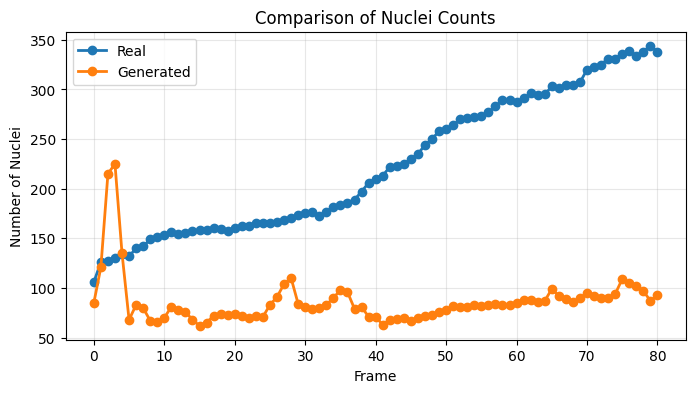


Detecting potential division events...
Detected 71 potential division events

Detecting potential division events...
Detected 38 potential division events

Division Statistics:
  real_initial_count: 106
  real_final_count: 338
  gen_initial_count: 85
  gen_final_count: 93
  real_growth_ratio: 3.188679245283019
  gen_growth_ratio: 1.0941176470588236
  real_growth_absolute: 232
  gen_growth_absolute: 8
  real_division_events_count: 71
  gen_division_events_count: 38
  real_avg_division_interval: 1.1142857142857143
  gen_avg_division_interval: 2.027027027027027


In [3]:
real_npy  = "../masks_output/checkpoint-900-val-old/00007_01_masks.npy"
gen_npy   = "../masks_output/i2v_r64_250/LT0001_02-00266_01_seed9_S50_G8_F81_FPS10_masks.npy"

compare_two_mask_videos_inline(real_npy, gen_npy, window=3, threshold=0.5)

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


def create_segmentation_overlay(frame_uint8, mask, alpha=0.5):
    """
    Simple overlay:
    - 'frame_uint8' is a 2D grayscale image (H,W)
    - 'mask' is an integer or binary mask (H,W) where mask>0 = segmented region
    - 'alpha' controls the overlay intensity
    Returns an RGB overlay.
    """
    # Convert grayscale [H,W] to RGB [H,W,3]
    overlay_img = np.stack([frame_uint8]*3, axis=-1).astype(np.uint8)
    
    # We'll tint the mask region red
    mask_bin = (mask > 0)
    color = [255, 0, 0]
    
    # Blend where mask>0
    overlay_img[mask_bin, 0] = (1 - alpha)*overlay_img[mask_bin, 0] + alpha*color[0]
    overlay_img[mask_bin, 1] = (1 - alpha)*overlay_img[mask_bin, 1] + alpha*color[1]
    overlay_img[mask_bin, 2] = (1 - alpha)*overlay_img[mask_bin, 2] + alpha*color[2]
    
    return overlay_img.astype(np.uint8)

def animate_segmentation_with_counts(frames_uint8, masks, fps=5):
    """
    Creates a Matplotlib animation that displays:
     - The overlay of frames with their segmentation masks
     - A text label for the cell count in each frame (computed from the mask)
     
    Args:
      frames_uint8: (T,H,W) in uint8 grayscale [0..255]
      masks:        (T,H,W) integer or binary labels
      fps:          frames per second for the animation
      
    Returns:
      ani: Matplotlib FuncAnimation object (use HTML(ani.to_jshtml()) to display)
    """
    # 1) Compute the nucleus counts for each frame
    counts = []
    for t in range(len(frames_uint8)):
        count = count_nuclei(masks[t])  # or simply (masks[t] > 0).max() for quick check
        counts.append(count)
    counts = np.array(counts)

    # 2) Create overlay frames (so we don't recalc in each animation update)
    overlay_frames = []
    for t in range(len(frames_uint8)):
        overlay_t = create_segmentation_overlay(frames_uint8[t], masks[t], alpha=0.5)
        overlay_frames.append(overlay_t)

    # 3) Setup figure/axes
    fig, ax = plt.subplots(figsize=(6,6))
    plt.tight_layout()
    
    # Initially show the first frame
    im = ax.imshow(overlay_frames[0], interpolation='nearest')
    count_text = ax.text(10, 30, f"Count: {counts[0]}", color='yellow',
                         fontsize=12, backgroundcolor='black')

    def init():
        im.set_data(overlay_frames[0])
        count_text.set_text(f"Count: {counts[0]}")
        return [im, count_text]

    def update(frame_idx):
        im.set_data(overlay_frames[frame_idx])
        count_text.set_text(f"Count: {counts[frame_idx]}")
        return [im, count_text]

    ani = animation.FuncAnimation(
        fig, update, 
        frames=range(len(overlay_frames)), 
        init_func=init, 
        interval=1000/fps,  # in ms
        blit=True
    )
    plt.close(fig)
    return ani

In [7]:
from video_utils import load_video
# Example usage in a Jupyter cell:
# Suppose you already have frames_uint8 (T,H,W) and segmentation masks (T,H,W).
# frames_uint8 could come from your video_utils.load_video() if you still have
# the original .mp4 or you can store them in .npy. 
#
# If you only have masks, you won't have the original frames for overlay unless
# you saved them. For demonstration, let's do a hypothetical load:

real_video = "../../data/processed/idr0013/LT0001_09/00007_01.mp4"
real_npy  = "../masks_output/checkpoint-900-val-old/00007_01_masks.npy"
# gen_npy   = "./masks_output/i2v_r64_250/LT0001_02-00266_01_seed9_S50_G8_F81_FPS10_masks.npy"

real_video_frames = load_video(real_video)  # shape (T,H,W), dtype uint8
real_video_masks  = np.load(real_npy) # shape (T,H,W)

# If they differ in T, you might need to truncate one or the other.

# Then create the animation:
ani = animate_segmentation_with_counts(real_video_frames, real_video_masks, fps=5)

# Display inline
HTML(ani.to_jshtml())

Loading frames:   0%|          | 0/81 [00:00<?, ?it/s]

Loading frames: 100%|██████████| 81/81 [00:00<00:00, 458.06it/s]


Loaded 81 frames with shape (81, 768, 1360)
